## Обработка изображений и компьютерное зрение
## Урок 1

Напишите на Python реализацию как минимум одного алгоритма на выбор: любая на выбор цветовая обработка, перевод в другое цветовое пространство или фильтрация. Изображение выберите самостоятельно.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import scipy.signal
import numpy as np
from skimage.color import rgb2hsv, hsv2rgb
import imageio

## Загрузка цветного изображения

In [2]:
img = imageio.imread('buddy_min.jpg')
img = img.astype(np.float32) / 255
print(img.shape)

(4032, 3024, 3)


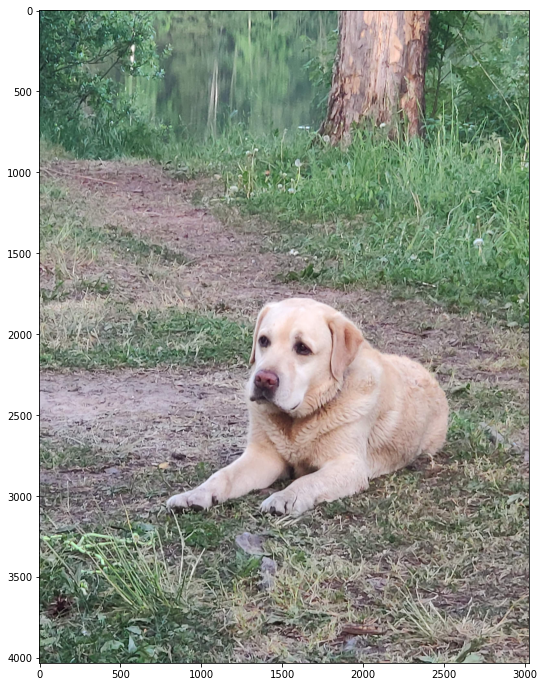

In [3]:
plt.figure(figsize=(10, 12))
plt.imshow(img)

## Линейное уменьшение яркости

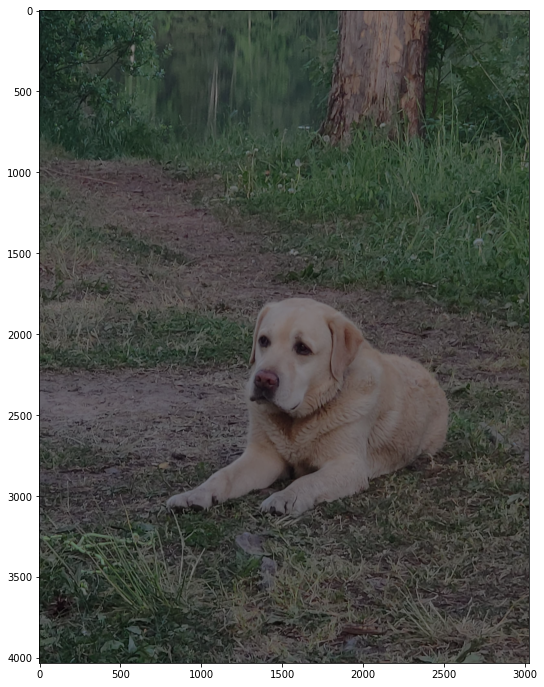

In [4]:
plt.figure(figsize=(10, 12))
plt.imshow(img/2)

## Линейное увеличение яркости


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


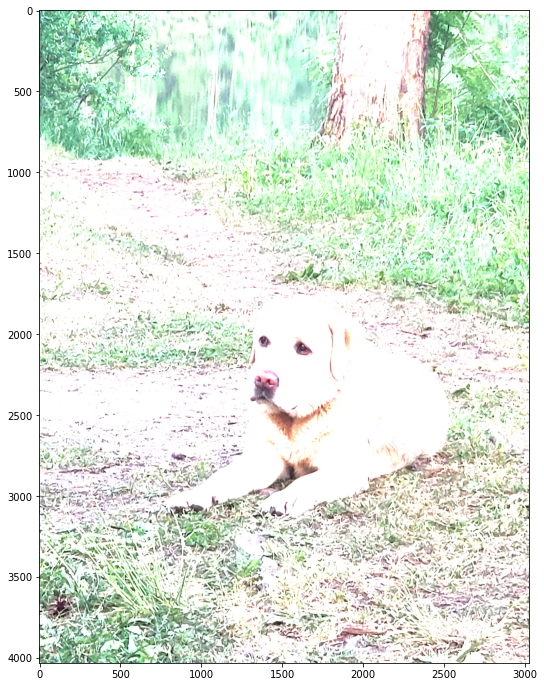

In [5]:
plt.figure(figsize=(10, 12))
plt.imshow(img*2)

Явно выскочили за пределы допустимого диапазона, да и ноутбук ругается.

## Нелинейное уменьшение яркости

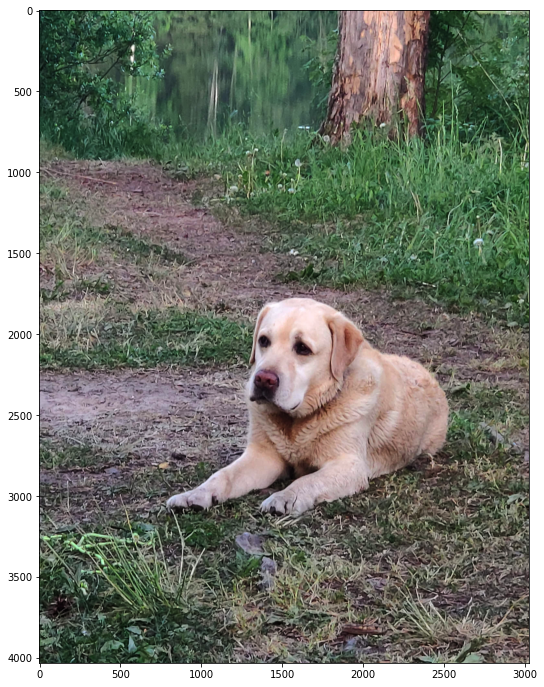

In [6]:
plt.figure(figsize=(10, 12))
plt.imshow(img**1.5) 

## Нелинейное увеличение яркости

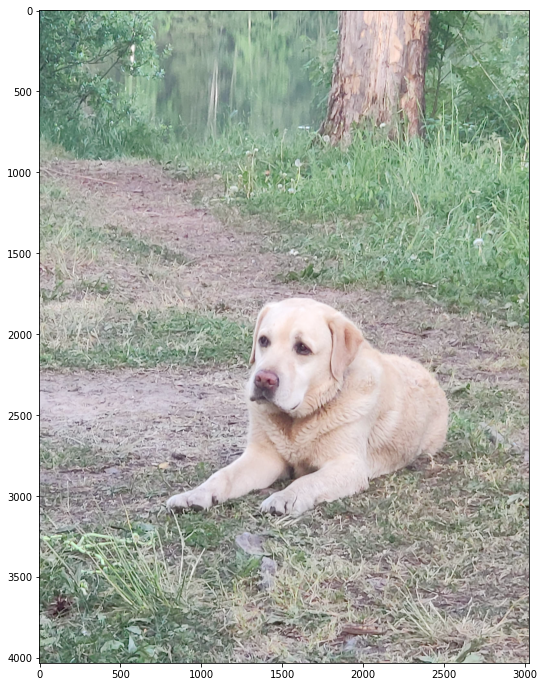

In [7]:
plt.figure(figsize=(10, 12))
plt.imshow(img**0.7) 

## Цветовое пространство HSV

In [8]:
img_hsv = rgb2hsv(img)

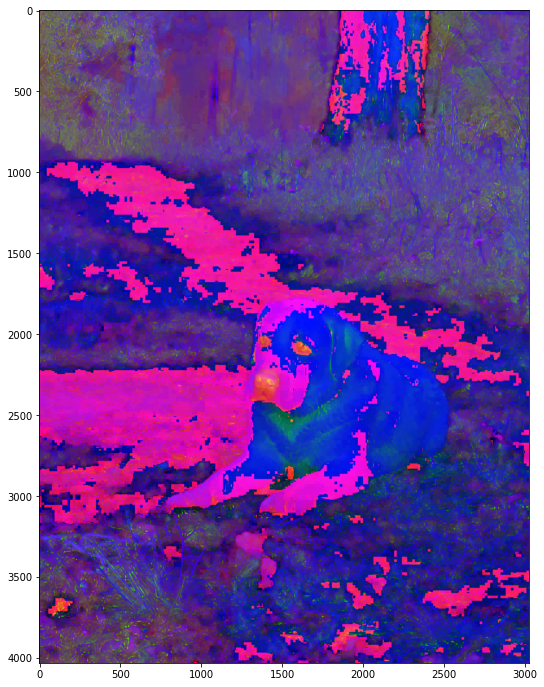

In [9]:
plt.figure(figsize=(10, 12))
plt.imshow(img_hsv)

Кажется, пчелы именно так и видят окружающий мир. Может, поэтому они бывают злобными?

## Линейное уменьшение насыщенности

In [10]:
img_hsv_new = np.copy(img_hsv)
img_hsv_new[:, :, 1] /= 1.8
img_new = hsv2rgb(img_hsv_new)

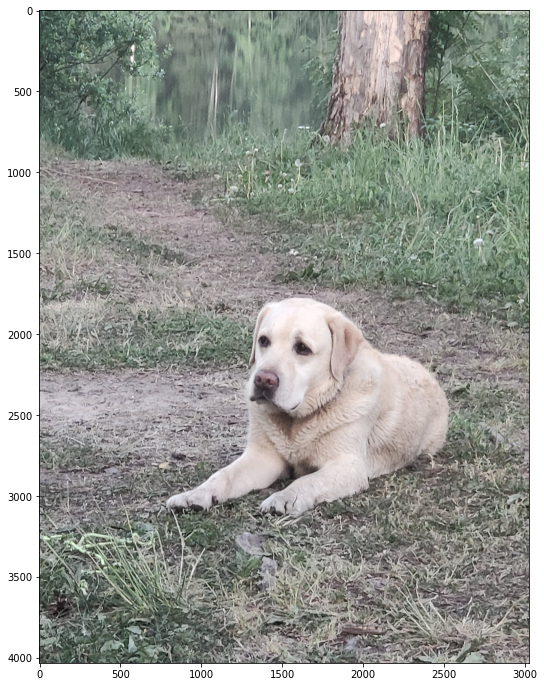

In [11]:
plt.figure(figsize=(10, 12))
plt.imshow(img_new)

## Линейное увеличение насыщенности


In [12]:
img_hsv_new = np.copy(img_hsv)
img_hsv_new[:, :, 1] *= 1.8
img_new = hsv2rgb(img_hsv_new)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


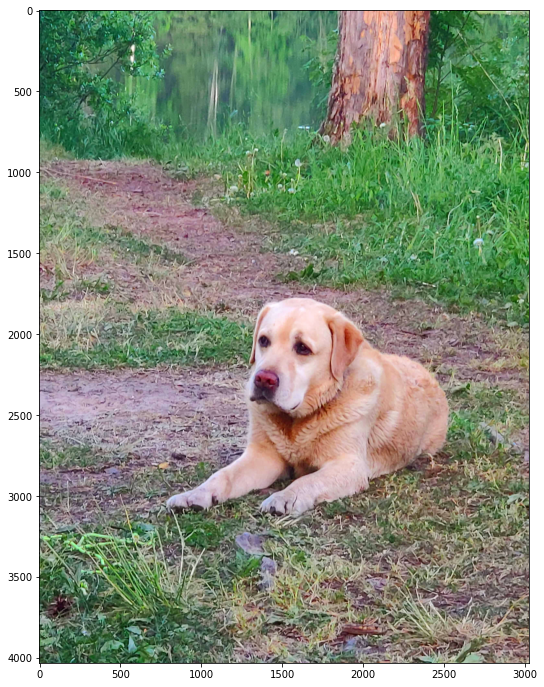

In [13]:
plt.figure(figsize=(10, 12))
plt.imshow(img_new)

Опять выскочили за диапазон.

## Изменение тона

In [14]:
img_hsv_new = np.copy(img_hsv)
img_hsv_new[:, :, 0] /= 1.8
img_new = hsv2rgb(img_hsv_new)

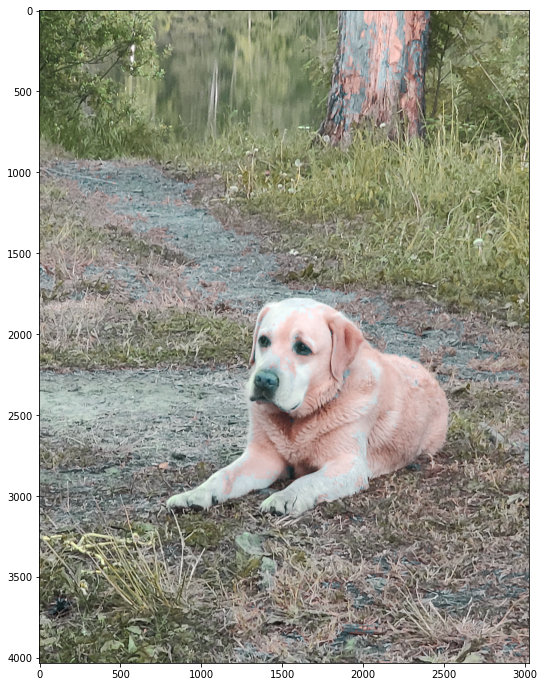

In [15]:
plt.figure(figsize=(10, 12))
plt.imshow(img_new)

Хорошо, что пес не видит что тут с ним творят, а то еще вдумчивее стал бы.

__Поэкспериментируем со сверткой.__

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


CPU times: user 3.45 s, sys: 9.09 ms, total: 3.46 s
Wall time: 3.45 s


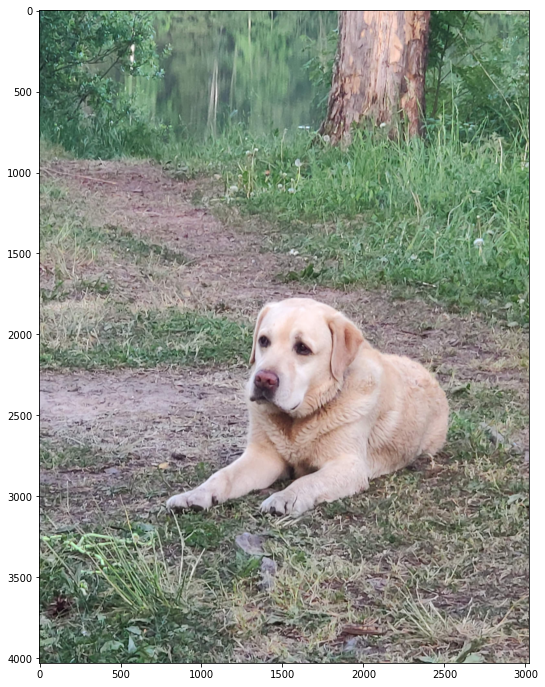

In [17]:
# scipy.signal
%%time
win_size = (5, 5)
# img = imageio.imread('buddy_min.jpg')
# img = img.astype(np.float32) / 255
w = np.ones(win_size, dtype=np.float32)
w /= np.sum(w)
out_img = []
for c in range(3):
    out_img.append(scipy.signal.correlate2d(img[:,:,c], w, mode='valid'))
out_img = np.stack(out_img, axis=2)
plt.figure(figsize=(10, 12))
plt.imshow(out_img)


Еле-еле видно, что была какая-то обработка. Зато относительно быстро. Попробуем Гаусса.

CPU times: user 3min 31s, sys: 37 ms, total: 3min 31s
Wall time: 3min 31s


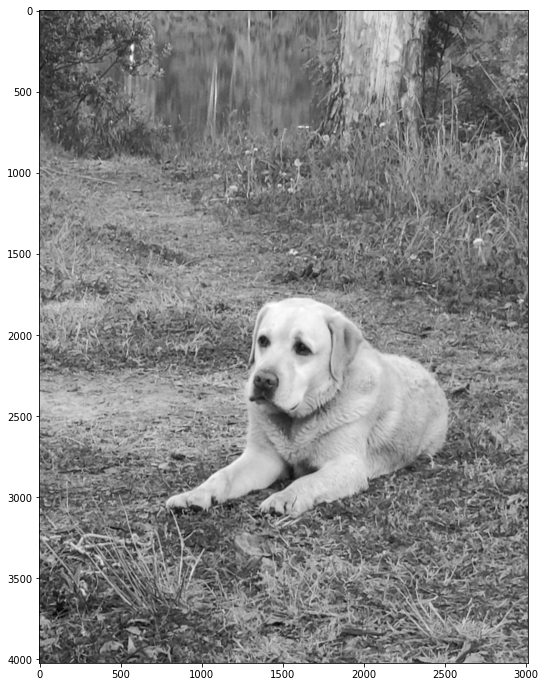

In [24]:
# Гаусс
%%time
win_size = (11, 11,3)
sigma = 3
w = np.zeros(win_size, dtype=np.float32)
for i in range(w.shape[0]):
  for j in range(w.shape[1]):
    w[i,j] = np.exp(-(i-w.shape[0]//2)**2 / sigma**2 / 2 
                    -(j-w.shape[1]//2)**2 / sigma**2 / 2)
w = w / np.sum(w)

out_img = np.zeros(
    (img.shape[0] - w.shape[0] + 1,
     img.shape[1] - w.shape[1] + 1), 
     dtype=np.float32)

for i in range(out_img.shape[0]):
    for j in range(out_img.shape[1]):
        x = img[i:i+w.shape[0], j:j+w.shape[1]]

        out_img[i,j] = np.sum(w * x)

plt.figure(figsize=(10, 12))
plt.imshow(np.abs(out_img), cmap='gray')


Обработка заняла вечность.